## Import everything

In [ ]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from google.colab import files
import os
from google.colab.patches import cv2_imshow
import cv2
import dlib
import requests
from bs4 import BeautifulSoup
import sys
import imgaug as ia
from imgaug import augmenters as iaa
import tensorflow as tf
import tensorflow_datasets as tfds

from tensorflow.keras import layers
from tensorflow.keras.datasets import mnist

import keras
from keras.models import Model
from keras.layers import *

In [ ]:
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU

  Created wheel for gputil: filename=GPUtil-1.4.0-cp36-none-any.whl size=7411 sha256=b83a7a6b02fa5e3a844f261208853f2837d76c62d93e972983855ea245813f74
  Stored in directory: /root/.cache/pip/wheels/3d/77/07/80562de4bb0786e5ea186911a2c831fdd0018bda69beab71fd
Successfully built gputil


In [ ]:
!pip install -q pyyaml h5py  # Required to save models in HDF5 format

### Mount Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Image Augmentation Functions (not used right now)

In [ ]:
IMG_SIZE = 128
tf.random.set_seed(1234);

img_buffer = np.empty((10030, 128, 128, 3))
def augment_images(dir):
    count = 0
    for f in os.listdir("./"+dir):
        print(f)
        img = cv2.imread(dir+"/"+f, cv2.IMREAD_COLOR)
        img_resized = tf.image.resize(img, [128, 128])
        img_buffer[count] = img_resized
        count += 1
        for i in range(16):
            try:
                aug_img, label = augment(img, "label")
                img_buffer[count] = aug_img[:,:,:]
                count += 1
            except:
                print("\ndoesn't work\n",f)
            #cv2_imshow(aug_img.numpy() * 255)


def resize_and_rescale(image, label):
    image = tf.cast(image, tf.float32)
    image = (image / 255.0)
    return image, label

def augment(image,label):
    image, label = resize_and_rescale(image, label)
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.image.random_saturation(image, 0.66, 1.5)
    image = tf.image.random_contrast(image, 0.8, 1.2)
    image = tf.image.random_hue(image, max_delta=0.1)
    # Random crop back to the original size
    image = tf.image.random_crop(image, size=[128, 128, 3])
    image = tf.image.resize(image, [128, 128])
    #   image = tf.clip_by_value(image, 0, 1)
    return image, label


### Facial detection area (placeholder)

### Make Generator

Creates a generator which takes in some random noise and 
runs it through multiple layers to output an image. It resizes the input 
as it goes and before each resizing it runs LeakyReLU in order to help it 
converge faster as it amplifies positive values and zeros out negative 
ones. It creates artwork for the discriminator to try to determine if the 
art is real or “fake”. 

In [ ]:
def make_generator():
    model = tf.keras.Sequential()
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(110,)))
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((8, 8, 256)))
    assert model.output_shape == (None, 8, 8, 256) # Note: None is the batch size

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 8, 8, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 16, 16, 64)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 32, 32, 32)
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(16, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 64, 64, 16)
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 128, 128, 3)

    return model

### Make Discriminator

make_discriminator produces a convolutional neural network image classifier.
It uses tf.keras.layers.Conv2DTranspose layers to add more filters [add here] 
The dropout is used to denoise Convolutional layers (from Tensorflow).
This discriminator will classify the generated artwork as real or “fake"
using postive numbers for real images and negative numbers for fake images.

In [ ]:
def make_discrim_two_in():
    # define two sets of inputs
    # Facial features
    featInput = Input(shape=(10,))
    # Image input
    imageInput = Input(shape=(128,128,3))
    # the first branch operates on the first input
    x = Dense(8, activation="relu")(featInput)
    x = Dense(4, activation="relu")(x)
    x = Model(inputs=featInput, outputs=x)
    # the second branch opreates on the second input
    y = Conv2D(32, 5, activation="relu")(imageInput)
    y = tf.keras.layers.LeakyReLU()(y)
    y = AveragePooling2D(2,2)(y)
    y = Conv2D(64,5,padding='same')(y)
    y = tf.keras.layers.LeakyReLU()(y)
    y = AveragePooling2D(2,2)(y)
    y = Conv2D(128,5,padding='same')(y)
    y = tf.keras.layers.LeakyReLU()(y)
    y = AveragePooling2D(2,2)(y)
    y = Flatten()(y)
    y = Dense(64)(y)
    y = tf.keras.layers.LeakyReLU()(y)
    y = Dense(32)(y)
    y = tf.keras.layers.LeakyReLU()(y)
    y = Model(inputs=imageInput, outputs=y)
    # combine the output of the two branches
    combined = concatenate([x.output, y.output])
    # apply a FC layer and then a regression prediction on the
    # combined outputs
    z = Dense(32)(combined)
    z = tf.keras.layers.LeakyReLU()(z)
    z = Dense(16)(z)
    z = tf.keras.layers.LeakyReLU()(z)
    z = Dense(1)(z)
    z = Activation('sigmoid')(z)

    # our model will accept the inputs of the two branches and
    # then output a single value
    model = Model(inputs=[x.input, y.input], outputs=z)
    return model

### Defining the loss functions and optimizers

In [ ]:
def discriminator_loss(real_output, fake_output):
    real_loss = tf.keras.losses.BinaryCrossentropy()(tf.ones_like(real_output), real_output)
    fake_loss = tf.keras.losses.BinaryCrossentropy()(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    # add reconstruction loss here
    return tf.keras.losses.BinaryCrossentropy()(tf.ones_like(fake_output), fake_output)

generator_optimizer = tf.keras.optimizers.Adam(3e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(3e-4)

Experimenting with WikiArt abstract images

In [ ]:
# ! pip install -q kaggle

# from google.colab import files
# files.upload()

# ! mkdir ~/.kaggle
# ! cp kaggle.json ~/.kaggle/
# ! chmod 600 ~/.kaggle/kaggle.json
# ! kaggle datasets download -d ipythonx/wikiart-gangogh-creating-art-gan

In [ ]:
#np.load("./drive/MyDrive/ganDatasetAugmented.npz")
with np.load("./drive/MyDrive/pollockAugmented.npz") as data:
    print(data.files)
    x = data["arr_0"]

['arr_0']


(740, 128, 128, 3)


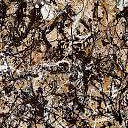

In [ ]:
print(x.shape)
# x = x * 255.0
cv2_imshow(x[58])
# x = x[:916]
#X = tf.convert_to_tensor(np.repeat(x, 12, axis=0))


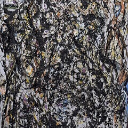

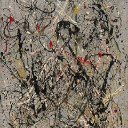

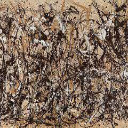

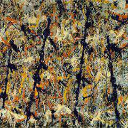

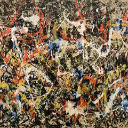

...

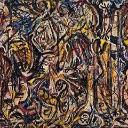

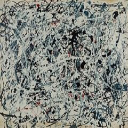

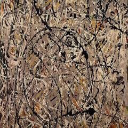

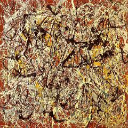

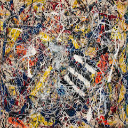

In [ ]:
for i in range(len(x)):
    if i%21 == 0:
        cv2_imshow(x[i])


In [ ]:
print((x[0] - 127.5) / 127.5)
x = (x - 127.5) / 127.5

[[[ 0.24477635  0.18301164  0.15948223]
  [ 0.4801394   0.4046492   0.37866881]
  [ 0.48768382  0.39846814  0.37003676]
  ...
  [-0.10592065 -0.0218367   0.05869332]
  [-0.24548866 -0.10428922  0.02939645]
  [-0.63426011 -0.4153799  -0.31423866]]

 [[ 0.40844822  0.3439951   0.32853094]
  [ 0.54737286  0.47038909  0.44739583]
  [ 0.44037224  0.34816942  0.3275046 ]
  ...
  [-0.36577819 -0.25752145 -0.21662837]
  [-0.04314491  0.09405637  0.195481  ]
  [-0.64618566 -0.47130821 -0.37855392]]

 [[ 0.61387102  0.5443704   0.5443704 ]
  [ 0.47615656  0.39833027  0.37721354]
  [ 0.35625     0.2625      0.24669118]
  ...
  [-0.464231   -0.38643536 -0.38651195]
  [-0.50148591 -0.40821844 -0.34474571]
  [-0.53290441 -0.42350643 -0.32949602]]

 ...

 [[ 0.33818934  0.29519761  0.30253523]
  [-0.0932598  -0.10075827 -0.08488817]
  [-0.68039982 -0.70487898 -0.68796722]
  ...
  [ 0.47382812  0.42804075  0.43294271]
  [ 0.11313572  0.05259651  0.09761029]
  [-0.70476409 -0.78736213 -0.67627911]]

 [

### Load and prepare the dataset

In [ ]:
#(train_images, train_labels), (_, _) = tf.keras.datasets.mnist.load_data()#tf.keras.datasets.mnist.load_data()

In [ ]:
# print(train_images.shape)
# plt.imshow(train_images[0])

In [ ]:
# train_images = train_images.reshape(train_images.shape[0], 32, 32, 3).astype('float32')
# train_images = (train_images - 127.5) / 127.5 # Normalize the images to [-1, 1]
# #img = cv2.imread(train_images[0])
# img = cv2.resize(train_images[0], dsize=(128,128))
# plt.imshow(img)
# resized = np.empty((10000, 128, 128, 3))
# for idx, ti in enumerate(train_images[:len(train_images)//6]):
#     img = cv2.resize(ti, dsize=(128,128))
#     #img = np.repeat(img[:, :, np.newaxis], 3, axis=2)
#     resized[idx] = img


In [ ]:
# temp = np.repeat(img[:, :, np.newaxis], 3, axis=2)
# print(temp)
# print(temp.shape)
# plt.imshow(temp)

In [ ]:
BUFFER_SIZE = 60000
BATCH_SIZE = 256

In [ ]:
# Batch and shuffle the data
train_dataset = tf.data.Dataset.from_tensor_slices(x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [ ]:
del x

In [ ]:
#del train_images

### Save checkpoint

In [ ]:
# checkpoint_dir = './training_checkpoints'
# checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
# checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
#                                  discriminator_optimizer=discriminator_optimizer,
#                                  generator=generator,
#                                  discriminator=discriminator)

### Define the training loop

In [ ]:
EPOCHS = 50
noise_dim = 100
num_examples_to_generate = 16

# We will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, noise_dim])

In [ ]:
# features needs to be broken into chunks of BATCH_SIZE
# @tf.function
def train_step(images, features):
    #print("in train step")
    #print(features, type(features))
    #print(images.shape)
    BATCH_SIZE = len(images)
    print("BATCH_SIZE",BATCH_SIZE)
    noise = []
    noise = tf.convert_to_tensor(np.hstack([np.random.normal(0, 1, size=(BATCH_SIZE, 100)), features]).astype(np.float32))
    noise = tf.reshape(noise, [BATCH_SIZE, 110])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)
    #   print("generated_images.shape",generated_images.shape)
    #   print("images.shape",images.shape)
    #   print("features.shape",features.shape)
      real_output = discriminator((features, images), training=True)
      fake_output = discriminator((features, generated_images), training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    print("Gen loss:", gen_loss.numpy())
    print("Disc loss:", disc_loss.numpy())
    print("Disc accuracy:", tf.keras.metrics.BinaryAccuracy()(tf.round(fake_output), np.zeros(fake_output.shape)).numpy())
    cv2_imshow(generated_images[0, :, :, :].numpy() * 255.0)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # check with MNIST dataset
    # print("Gen grads:", gradients_of_generator)
    # print("Disc grads:", gradients_of_discriminator)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))


In [ ]:
# Improvements:
# 1. Increase dataset size
# 2. Add batch normalization -> nope. Read paper on weight normalization
# 3. Add loss functions to GAN
# 4. Increase size of input latent vector for Generator

generator = make_generator() #tf.keras.models.load_model('./drive/MyDrive/generator-new')
discriminator = make_discrim_two_in() #tf.keras.models.load_model('./drive/MyDrive/discriminator-new')

# creation of random noise plus some number of conditional variables
noise = tf.convert_to_tensor(np.concatenate([np.random.normal(0, 1, 100), np.array([0,0,0,0,0,0,0,0,0,0])], axis=None).astype(np.float32))
noise = tf.reshape(noise, [1, 110])

# running the generator with no training
#generated_image = generator(noise, training=False)

#print(generated_image.shape)

batch_size = 256

def train(imgdataset, featdataset, epochs):
    for epoch in range(epochs):
        print("\nEpoch:", epoch)
        #GPUs = GPU.getGPUs()
        #gpu = GPUs[0]
        # def printm():
        #     process = psutil.Process(os.getpid())
        #     print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
        #     print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))
        # if epoch % 10 == 0:
        #     printm()
        count = 0
        for image_batch in imgdataset:
            #print("here",image_batch.shape)
            train_step(image_batch, featdataset[count:min(count + batch_size, 10000)])
            count += batch_size
        # Produce images for the GIF as we go
        # display.clear_output(wait=True)
        # generate_and_save_images(generator,epoch + 1,seed)
        # for i in range(0, int(imgdataset.shape[0]), batch_size):
        # print("Batch", i, "from", i, "to", i + batch_size)
        # train_step(imgdataset[i:min(i+batch_size, imgdataset.shape[0] - 1),:,:,:], featdataset[i:min(i+batch_size, imgdataset.shape[0] - 1),:])

# feats = tf.convert_to_tensor()

In [ ]:
del generated_image

### Train the model


Epoch: 0
BATCH_SIZE 256
Gen loss: 2.0368478
Disc loss: 0.5580671
Disc accuracy: 0.93359375


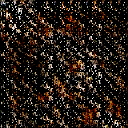

BATCH_SIZE 256
Gen loss: 2.7562892
Disc loss: 0.58713603
Disc accuracy: 0.98046875


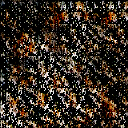

BATCH_SIZE 228
Gen loss: 1.8913544
Disc loss: 0.54367065
Disc accuracy: 0.8903509


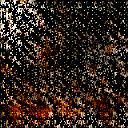


Epoch: 1
BATCH_SIZE 256
Gen loss: 2.0282855
Disc loss: 0.5584879
Disc accuracy: 0.8828125


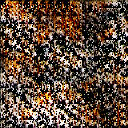

BATCH_SIZE 256
Gen loss: 3.288555
Disc loss: 0.62823564
Disc accuracy: 1.0


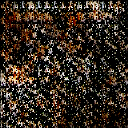

BATCH_SIZE 228
Gen loss: 1.3310717
Disc loss: 0.66909975
Disc accuracy: 0.7236842


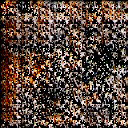


Epoch: 2
BATCH_SIZE 256
Gen loss: 3.987445
Disc loss: 0.6370495
Disc accuracy: 1.0


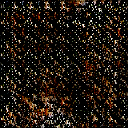

BATCH_SIZE 256
Gen loss: 2.2861576
Disc loss: 0.4070414
Disc accuracy: 0.94921875


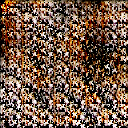

BATCH_SIZE 228
Gen loss: 1.7913319
Disc loss: 0.4717716
Disc accuracy: 0.89912283


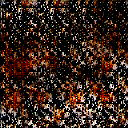


Epoch: 3
BATCH_SIZE 256
Gen loss: 4.03773
Disc loss: 0.5221689
Disc accuracy: 0.99609375


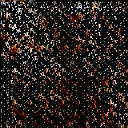

BATCH_SIZE 256
Gen loss: 2.616675
Disc loss: 0.37817466
Disc accuracy: 0.97265625


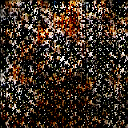

BATCH_SIZE 228
Gen loss: 1.7013661
Disc loss: 0.48609272
Disc accuracy: 0.9035088


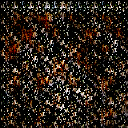


Epoch: 4
BATCH_SIZE 256
Gen loss: 4.0800514
Disc loss: 0.5831015
Disc accuracy: 1.0


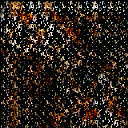

BATCH_SIZE 256
Gen loss: 2.0880346
Disc loss: 0.4548556
Disc accuracy: 0.93359375


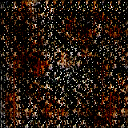

BATCH_SIZE 228
Gen loss: 1.9861321
Disc loss: 0.3877501
Disc accuracy: 0.8903509


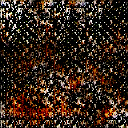


Epoch: 5
BATCH_SIZE 256
Gen loss: 5.0751357
Disc loss: 0.7472044
Disc accuracy: 1.0


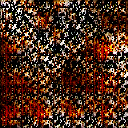

BATCH_SIZE 256
Gen loss: 2.9777863
Disc loss: 0.4927659
Disc accuracy: 0.984375


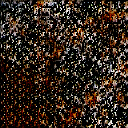

BATCH_SIZE 228
Gen loss: 0.76541936
Disc loss: 1.1020142
Disc accuracy: 0.42105263


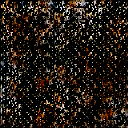


Epoch: 6
BATCH_SIZE 256
Gen loss: 8.988668
Disc loss: 1.846736
Disc accuracy: 1.0


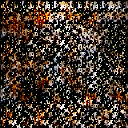

BATCH_SIZE 256
Gen loss: 7.8643303
Disc loss: 1.5103787
Disc accuracy: 0.99609375


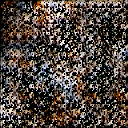

BATCH_SIZE 228
Gen loss: 0.69686466
Disc loss: 1.4574082
Disc accuracy: 0.3859649


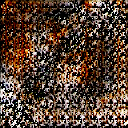


Epoch: 7
BATCH_SIZE 256
Gen loss: 4.1024942
Disc loss: 0.5361482
Disc accuracy: 0.95703125


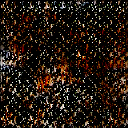

BATCH_SIZE 256
Gen loss: 6.4759507
Disc loss: 0.9665757
Disc accuracy: 0.98828125


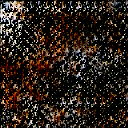

BATCH_SIZE 228
Gen loss: 4.611104
Disc loss: 0.8138575
Disc accuracy: 0.9035088


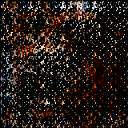


Epoch: 8
BATCH_SIZE 256
Gen loss: 1.9718239
Disc loss: 1.1224726
Disc accuracy: 0.69140625


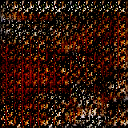

BATCH_SIZE 256
Gen loss: 4.111368
Disc loss: 0.74308217
Disc accuracy: 0.88671875


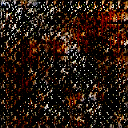

BATCH_SIZE 228
Gen loss: 6.066411
Disc loss: 1.1937947
Disc accuracy: 0.9517544


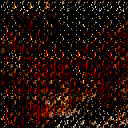


Epoch: 9
BATCH_SIZE 256
Gen loss: 4.3821034
Disc loss: 0.6957947
Disc accuracy: 0.90625


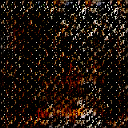

BATCH_SIZE 256
Gen loss: 2.337791
Disc loss: 1.2138888
Disc accuracy: 0.7265625


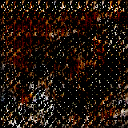

BATCH_SIZE 228
Gen loss: 3.7671556
Disc loss: 1.0731548
Disc accuracy: 0.8464912


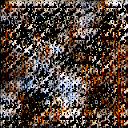


Epoch: 10
BATCH_SIZE 256
Gen loss: 4.756045
Disc loss: 1.04359
Disc accuracy: 0.90234375


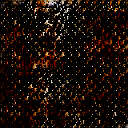

BATCH_SIZE 256
Gen loss: 4.2852693
Disc loss: 1.0809996
Disc accuracy: 0.87109375


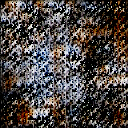

BATCH_SIZE 228
Gen loss: 3.4718113
Disc loss: 0.9305912
Disc accuracy: 0.82894737


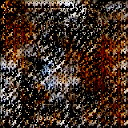


Epoch: 11
BATCH_SIZE 256
Gen loss: 2.786964
Disc loss: 0.95348966
Disc accuracy: 0.84375


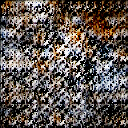

BATCH_SIZE 256
Gen loss: 3.5308096
Disc loss: 0.7818164
Disc accuracy: 0.86328125


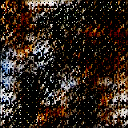

BATCH_SIZE 228
Gen loss: 3.855425
Disc loss: 0.63346237
Disc accuracy: 0.94736844


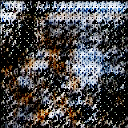


Epoch: 12
BATCH_SIZE 256
Gen loss: 2.3594801
Disc loss: 0.48113668
Disc accuracy: 0.87109375


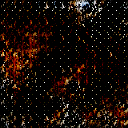

BATCH_SIZE 256
Gen loss: 2.876706
Disc loss: 0.50133294
Disc accuracy: 0.9609375


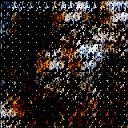

BATCH_SIZE 228
Gen loss: 2.719507
Disc loss: 0.39457083
Disc accuracy: 0.9166667


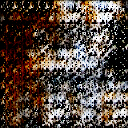


Epoch: 13
BATCH_SIZE 256
Gen loss: 3.0211284
Disc loss: 0.378654
Disc accuracy: 0.91796875


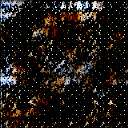

BATCH_SIZE 256
Gen loss: 4.062852
Disc loss: 0.3128631
Disc accuracy: 0.95703125


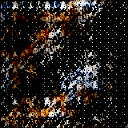

BATCH_SIZE 228
Gen loss: 4.841204
Disc loss: 0.44389147
Disc accuracy: 0.9385965


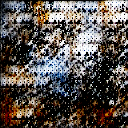


Epoch: 14
BATCH_SIZE 256
Gen loss: 4.5301566
Disc loss: 0.46315336
Disc accuracy: 0.9296875


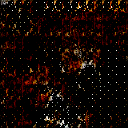

BATCH_SIZE 256
Gen loss: 3.9773476
Disc loss: 0.5031766
Disc accuracy: 0.8203125


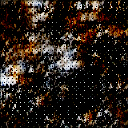

BATCH_SIZE 228
Gen loss: 4.9601293
Disc loss: 0.40644017
Disc accuracy: 0.9298246


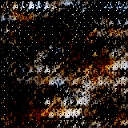


Epoch: 15
BATCH_SIZE 256
Gen loss: 6.0338526
Disc loss: 0.54474044
Disc accuracy: 0.92578125


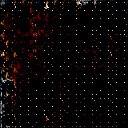

BATCH_SIZE 256
Gen loss: 6.0677423
Disc loss: 0.52540016
Disc accuracy: 0.9296875


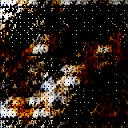

BATCH_SIZE 228
Gen loss: 5.32326
Disc loss: 0.57259434
Disc accuracy: 0.9035088


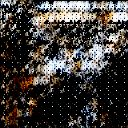


Epoch: 16
BATCH_SIZE 256
Gen loss: 4.5789804
Disc loss: 0.45543188
Disc accuracy: 0.8828125


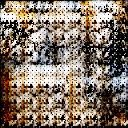

BATCH_SIZE 256
Gen loss: 5.2050185
Disc loss: 0.5154997
Disc accuracy: 0.89453125


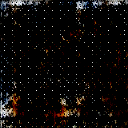

BATCH_SIZE 228
Gen loss: 5.443715
Disc loss: 0.5088433
Disc accuracy: 0.95614034


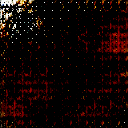


Epoch: 17
BATCH_SIZE 256
Gen loss: 4.3670306
Disc loss: 0.4372301
Disc accuracy: 0.9375


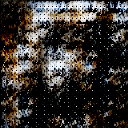

BATCH_SIZE 256
Gen loss: 3.1657677
Disc loss: 0.42978966
Disc accuracy: 0.87109375


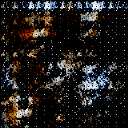

BATCH_SIZE 228
Gen loss: 3.7804036
Disc loss: 0.5432934
Disc accuracy: 0.9605263


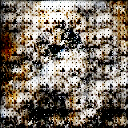


Epoch: 18
BATCH_SIZE 256
Gen loss: 3.8659885
Disc loss: 0.38701466
Disc accuracy: 0.984375


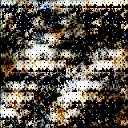

BATCH_SIZE 256
Gen loss: 3.4331844
Disc loss: 0.46335757
Disc accuracy: 0.9375


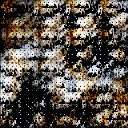

BATCH_SIZE 228
Gen loss: 3.0002198
Disc loss: 0.39216328
Disc accuracy: 0.88596493


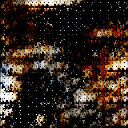


Epoch: 19
BATCH_SIZE 256
Gen loss: 3.9284265
Disc loss: 0.37333572
Disc accuracy: 0.98828125


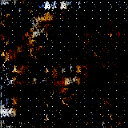

BATCH_SIZE 256
Gen loss: 3.9488707
Disc loss: 0.36961553
Disc accuracy: 0.984375


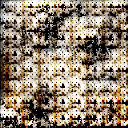

BATCH_SIZE 228
Gen loss: 3.2825572
Disc loss: 0.28505674
Disc accuracy: 0.94736844


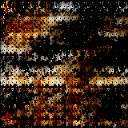


Epoch: 20
BATCH_SIZE 256
Gen loss: 3.1940825
Disc loss: 0.32613465
Disc accuracy: 0.98046875


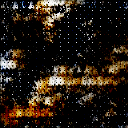

BATCH_SIZE 256
Gen loss: 3.3523192
Disc loss: 0.24614939
Disc accuracy: 0.95703125


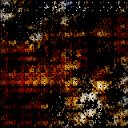

BATCH_SIZE 228
Gen loss: 4.0454607
Disc loss: 0.30350596
Disc accuracy: 0.9868421


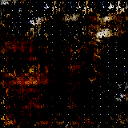


Epoch: 21
BATCH_SIZE 256
Gen loss: 3.9080458
Disc loss: 0.24030472
Disc accuracy: 0.98828125


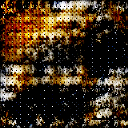

BATCH_SIZE 256
Gen loss: 3.4164257
Disc loss: 0.2524161
Disc accuracy: 0.96484375


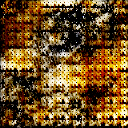

BATCH_SIZE 228
Gen loss: 3.5206788
Disc loss: 0.27142176
Disc accuracy: 0.9517544


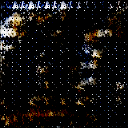


Epoch: 22
BATCH_SIZE 256
Gen loss: 4.118762
Disc loss: 0.22234711
Disc accuracy: 0.984375


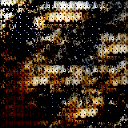

BATCH_SIZE 256
Gen loss: 4.7655587
Disc loss: 0.31836388
Disc accuracy: 0.9921875


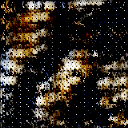

BATCH_SIZE 228
Gen loss: 3.6484337
Disc loss: 0.23775822
Disc accuracy: 0.96929824


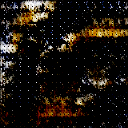


Epoch: 23
BATCH_SIZE 256
Gen loss: 2.9829
Disc loss: 0.32284892
Disc accuracy: 0.92578125


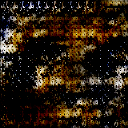

BATCH_SIZE 256
Gen loss: 4.154786
Disc loss: 0.23385376
Disc accuracy: 0.98046875


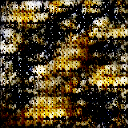

BATCH_SIZE 228
Gen loss: 4.6675415
Disc loss: 0.35433498
Disc accuracy: 0.9780702


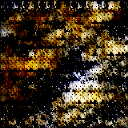


Epoch: 24
BATCH_SIZE 256
Gen loss: 3.5517173
Disc loss: 0.36598778
Disc accuracy: 0.953125


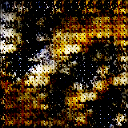

BATCH_SIZE 256
Gen loss: 2.6357198
Disc loss: 0.38439363
Disc accuracy: 0.890625


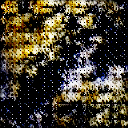

BATCH_SIZE 228
Gen loss: 4.1408553
Disc loss: 0.34742367
Disc accuracy: 0.9868421


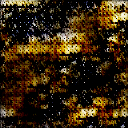


Epoch: 25
BATCH_SIZE 256
Gen loss: 3.480825
Disc loss: 0.40097213
Disc accuracy: 0.97265625


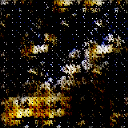

BATCH_SIZE 256
Gen loss: 2.3004408
Disc loss: 0.49742714
Disc accuracy: 0.85546875


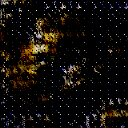

BATCH_SIZE 228
Gen loss: 3.151993
Disc loss: 0.3932426
Disc accuracy: 0.9605263


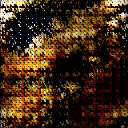


Epoch: 26
BATCH_SIZE 256
Gen loss: 3.4359195
Disc loss: 0.59364396
Disc accuracy: 0.953125


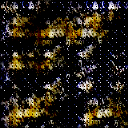

BATCH_SIZE 256
Gen loss: 2.1013176
Disc loss: 0.66733074
Disc accuracy: 0.82421875


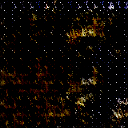

BATCH_SIZE 228
Gen loss: 2.7322946
Disc loss: 0.6260845
Disc accuracy: 0.9166667


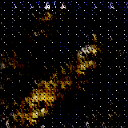


Epoch: 27
BATCH_SIZE 256
Gen loss: 3.1518223
Disc loss: 0.84231794
Disc accuracy: 0.96875


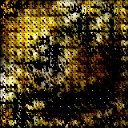

BATCH_SIZE 256
Gen loss: 0.79634356
Disc loss: 1.4949242
Disc accuracy: 0.37890625


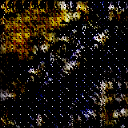

BATCH_SIZE 228
Gen loss: 4.7663846
Disc loss: 1.65778
Disc accuracy: 1.0


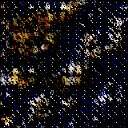


Epoch: 28
BATCH_SIZE 256
Gen loss: 2.3202648
Disc loss: 0.85031104
Disc accuracy: 0.87109375


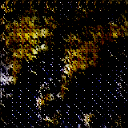

BATCH_SIZE 256
Gen loss: 0.5116133
Disc loss: 2.2620873
Disc accuracy: 0.21875


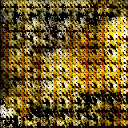

BATCH_SIZE 228
Gen loss: 4.8885937
Disc loss: 1.7020693
Disc accuracy: 0.99561405


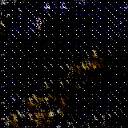


Epoch: 29
BATCH_SIZE 256
Gen loss: 4.252673
Disc loss: 1.5120752
Disc accuracy: 0.99609375


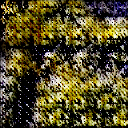

BATCH_SIZE 256
Gen loss: 0.41957912
Disc loss: 2.8160357
Disc accuracy: 0.19140625


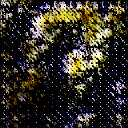

BATCH_SIZE 228
Gen loss: 2.1076033
Disc loss: 0.96660686
Disc accuracy: 0.8201754


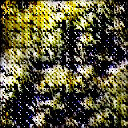


Epoch: 30
BATCH_SIZE 256
Gen loss: 5.7637053
Disc loss: 2.1440642
Disc accuracy: 1.0


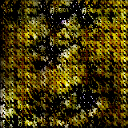

BATCH_SIZE 256
Gen loss: 2.7940602
Disc loss: 0.79080737
Disc accuracy: 0.93359375


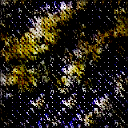

BATCH_SIZE 228
Gen loss: 0.6454861
Disc loss: 1.5707082
Disc accuracy: 0.32456142


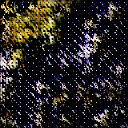


Epoch: 31
BATCH_SIZE 256
Gen loss: 2.7597055
Disc loss: 0.57628214
Disc accuracy: 0.91796875


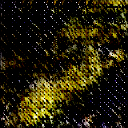

BATCH_SIZE 256
Gen loss: 5.403794
Disc loss: 1.1092986
Disc accuracy: 1.0


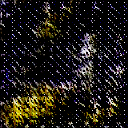

BATCH_SIZE 228
Gen loss: 3.9792027
Disc loss: 0.66874176
Disc accuracy: 1.0


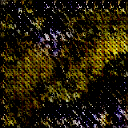


Epoch: 32
BATCH_SIZE 256
Gen loss: 1.2360971
Disc loss: 0.8114464
Disc accuracy: 0.625


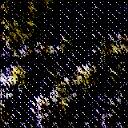

BATCH_SIZE 256
Gen loss: 2.0892873
Disc loss: 0.40672767
Disc accuracy: 0.8828125


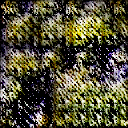

BATCH_SIZE 228
Gen loss: 4.715954
Disc loss: 0.3118668
Disc accuracy: 1.0


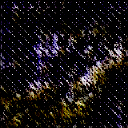


Epoch: 33
BATCH_SIZE 256
Gen loss: 6.1582966
Disc loss: 0.5242209
Disc accuracy: 1.0


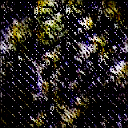

BATCH_SIZE 256
Gen loss: 5.3327956
Disc loss: 0.24541324
Disc accuracy: 1.0


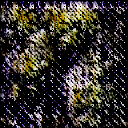

BATCH_SIZE 228
Gen loss: 3.5854049
Disc loss: 0.14630924
Disc accuracy: 0.99122804


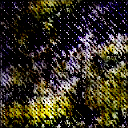


Epoch: 34
BATCH_SIZE 256
Gen loss: 2.4542787
Disc loss: 0.32493934
Disc accuracy: 0.91796875


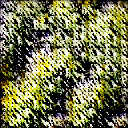

BATCH_SIZE 256
Gen loss: 3.4801083
Disc loss: 0.12344805
Disc accuracy: 0.9765625


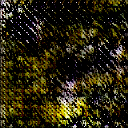

BATCH_SIZE 228
Gen loss: 4.9583793
Disc loss: 0.104009904
Disc accuracy: 0.99561405


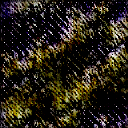


Epoch: 35
BATCH_SIZE 256
Gen loss: 6.479162
Disc loss: 0.11164645
Disc accuracy: 1.0


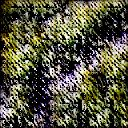

BATCH_SIZE 256
Gen loss: 6.8144746
Disc loss: 0.16294886
Disc accuracy: 1.0


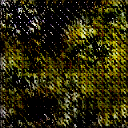

BATCH_SIZE 228
Gen loss: 6.3283544
Disc loss: 0.093245655
Disc accuracy: 1.0


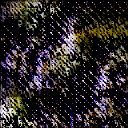


Epoch: 36
BATCH_SIZE 256
Gen loss: 5.4897118
Disc loss: 0.09487015
Disc accuracy: 0.98828125


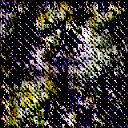

BATCH_SIZE 256
Gen loss: 4.440201
Disc loss: 0.09815946
Disc accuracy: 0.9765625


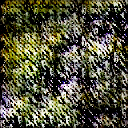

BATCH_SIZE 228
Gen loss: 4.107078
Disc loss: 0.14932361
Disc accuracy: 0.9649123


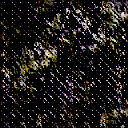


Epoch: 37
BATCH_SIZE 256
Gen loss: 4.329018
Disc loss: 0.14928143
Disc accuracy: 0.97265625


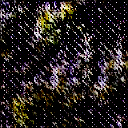

BATCH_SIZE 256
Gen loss: 5.1277575
Disc loss: 0.1893956
Disc accuracy: 0.96875


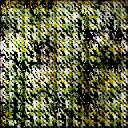

BATCH_SIZE 228
Gen loss: 5.4719515
Disc loss: 0.16197868
Disc accuracy: 0.99122804


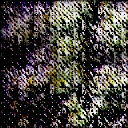


Epoch: 38
BATCH_SIZE 256
Gen loss: 5.7669163
Disc loss: 0.27588254
Disc accuracy: 0.96484375


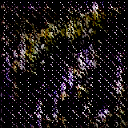

BATCH_SIZE 256
Gen loss: 4.6027474
Disc loss: 0.25036144
Disc accuracy: 0.953125


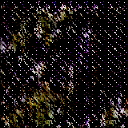

BATCH_SIZE 228
Gen loss: 3.5799468
Disc loss: 0.33987218
Disc accuracy: 0.8947368


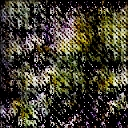


Epoch: 39
BATCH_SIZE 256
Gen loss: 3.5259113
Disc loss: 0.4221026
Disc accuracy: 0.90625


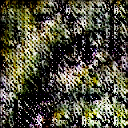

BATCH_SIZE 256
Gen loss: 4.1649246
Disc loss: 0.34945503
Disc accuracy: 0.9765625


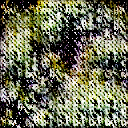

BATCH_SIZE 228
Gen loss: 3.7234674
Disc loss: 0.52917373
Disc accuracy: 0.9254386


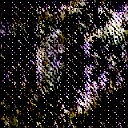


Epoch: 40
BATCH_SIZE 256
Gen loss: 3.2234364
Disc loss: 0.5955318
Disc accuracy: 0.9140625


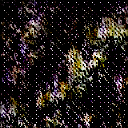

BATCH_SIZE 256
Gen loss: 2.9601045
Disc loss: 0.60219574
Disc accuracy: 0.87109375


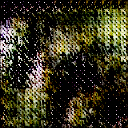

BATCH_SIZE 228
Gen loss: 3.035552
Disc loss: 0.60502994
Disc accuracy: 0.9385965


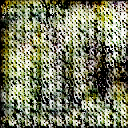


Epoch: 41
BATCH_SIZE 256
Gen loss: 2.081112
Disc loss: 0.6358365
Disc accuracy: 0.81640625


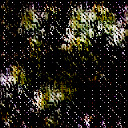

BATCH_SIZE 256
Gen loss: 2.580724
Disc loss: 0.7836882
Disc accuracy: 0.85546875


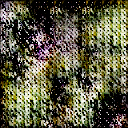

BATCH_SIZE 228
Gen loss: 3.23289
Disc loss: 0.8715024
Disc accuracy: 0.9254386


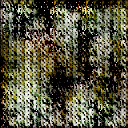


Epoch: 42
BATCH_SIZE 256
Gen loss: 2.1475909
Disc loss: 1.0682613
Disc accuracy: 0.6875


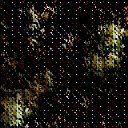

BATCH_SIZE 256
Gen loss: 4.6331964
Disc loss: 1.5608118
Disc accuracy: 0.97265625


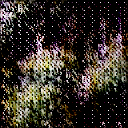

BATCH_SIZE 228
Gen loss: 1.4478068
Disc loss: 1.1502002
Disc accuracy: 0.57894737


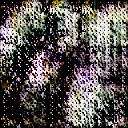


Epoch: 43
BATCH_SIZE 256
Gen loss: 2.982101
Disc loss: 1.0254602
Disc accuracy: 0.83984375


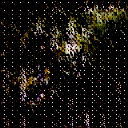

BATCH_SIZE 256
Gen loss: 4.020295
Disc loss: 1.3354971
Disc accuracy: 0.90625


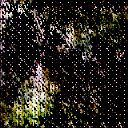

BATCH_SIZE 228
Gen loss: 1.87229
Disc loss: 1.215625
Disc accuracy: 0.5350877


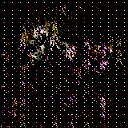


Epoch: 44
BATCH_SIZE 256
Gen loss: 3.9319859
Disc loss: 1.0148902
Disc accuracy: 0.88671875


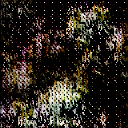

BATCH_SIZE 256
Gen loss: 4.7570066
Disc loss: 1.2119437
Disc accuracy: 0.9375


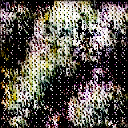

BATCH_SIZE 228
Gen loss: 2.7642887
Disc loss: 1.0388099
Disc accuracy: 0.71929824


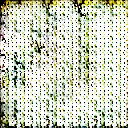


Epoch: 45
BATCH_SIZE 256
Gen loss: 2.3665767
Disc loss: 0.94832015
Disc accuracy: 0.65625


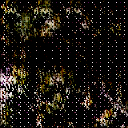

BATCH_SIZE 256
Gen loss: 3.58215
Disc loss: 1.0257831
Disc accuracy: 0.9296875


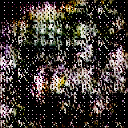

BATCH_SIZE 228
Gen loss: 2.8069673
Disc loss: 0.72025657
Disc accuracy: 0.8815789


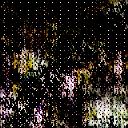


Epoch: 46
BATCH_SIZE 256
Gen loss: 1.5903087
Disc loss: 0.94952404
Disc accuracy: 0.6015625


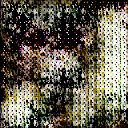

BATCH_SIZE 256
Gen loss: 3.1296115
Disc loss: 0.9629197
Disc accuracy: 0.91796875


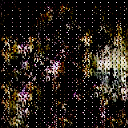

BATCH_SIZE 228
Gen loss: 2.9376125
Disc loss: 0.7882989
Disc accuracy: 0.9298246


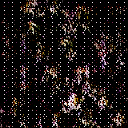


Epoch: 47
BATCH_SIZE 256
Gen loss: 2.4116335
Disc loss: 0.67859745
Disc accuracy: 0.85546875


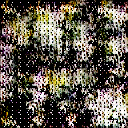

BATCH_SIZE 256
Gen loss: 1.7380108
Disc loss: 0.91091216
Disc accuracy: 0.69921875


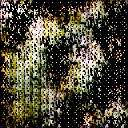

BATCH_SIZE 228
Gen loss: 2.9515417
Disc loss: 0.86192334
Disc accuracy: 0.9517544


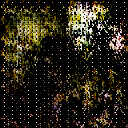


Epoch: 48
BATCH_SIZE 256
Gen loss: 2.467804
Disc loss: 0.8843156
Disc accuracy: 0.89453125


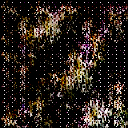

BATCH_SIZE 256
Gen loss: 1.7744415
Disc loss: 0.9371277
Disc accuracy: 0.69140625


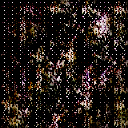

BATCH_SIZE 228
Gen loss: 2.1339316
Disc loss: 0.7779874
Disc accuracy: 0.8333333


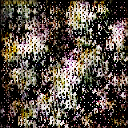


Epoch: 49
BATCH_SIZE 256
Gen loss: 3.0232036
Disc loss: 0.9512717
Disc accuracy: 0.94921875


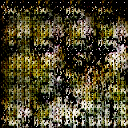

BATCH_SIZE 256
Gen loss: 2.1081593
Disc loss: 0.8512596
Disc accuracy: 0.83984375


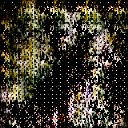

BATCH_SIZE 228
Gen loss: 1.5910631
Disc loss: 0.9386809
Disc accuracy: 0.71929824


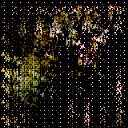


Epoch: 50
BATCH_SIZE 256
Gen loss: 2.3549824
Disc loss: 0.8641646
Disc accuracy: 0.8671875


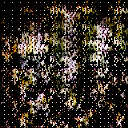

BATCH_SIZE 256
Gen loss: 2.8486695
Disc loss: 0.9684886
Disc accuracy: 0.94140625


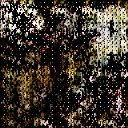

BATCH_SIZE 228
Gen loss: 1.3407918
Disc loss: 1.0377226
Disc accuracy: 0.57894737


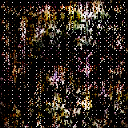


Epoch: 51
BATCH_SIZE 256
Gen loss: 1.8982232
Disc loss: 0.8477633
Disc accuracy: 0.84375


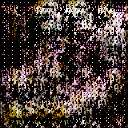

BATCH_SIZE 256
Gen loss: 2.7523415
Disc loss: 0.9375254
Disc accuracy: 0.9609375


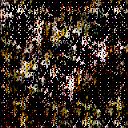

BATCH_SIZE 228
Gen loss: 2.0873733
Disc loss: 0.8681904
Disc accuracy: 0.8903509


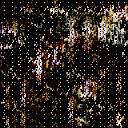


Epoch: 52
BATCH_SIZE 256
Gen loss: 1.3927052
Disc loss: 0.94088525
Disc accuracy: 0.703125


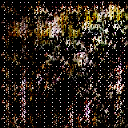

BATCH_SIZE 256
Gen loss: 2.3116167
Disc loss: 0.7406994
Disc accuracy: 0.90625


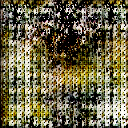

BATCH_SIZE 228
Gen loss: 2.7275786
Disc loss: 0.7858425
Disc accuracy: 0.9298246


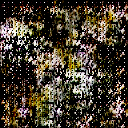


Epoch: 53
BATCH_SIZE 256
Gen loss: 2.1509027
Disc loss: 0.7780535
Disc accuracy: 0.84375


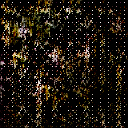

BATCH_SIZE 256
Gen loss: 1.6695062
Disc loss: 0.73601556
Disc accuracy: 0.75


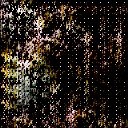

BATCH_SIZE 228
Gen loss: 2.4982667
Disc loss: 0.60421884
Disc accuracy: 0.94298244


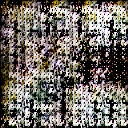


Epoch: 54
BATCH_SIZE 256
Gen loss: 2.712599
Disc loss: 0.6068809
Disc accuracy: 0.96484375


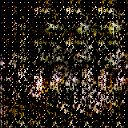

BATCH_SIZE 256
Gen loss: 2.088283
Disc loss: 0.67897105
Disc accuracy: 0.88671875


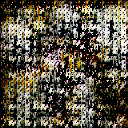

BATCH_SIZE 228
Gen loss: 2.0165184
Disc loss: 0.5644574
Disc accuracy: 0.88596493


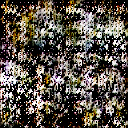


Epoch: 55
BATCH_SIZE 256
Gen loss: 2.2579963
Disc loss: 0.5637509
Disc accuracy: 0.9375


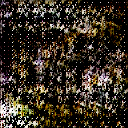

BATCH_SIZE 256
Gen loss: 2.6028857
Disc loss: 0.5925788
Disc accuracy: 0.9296875


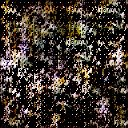

BATCH_SIZE 228
Gen loss: 2.3538222
Disc loss: 0.6136173
Disc accuracy: 0.85087717


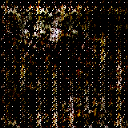


Epoch: 56
BATCH_SIZE 256
Gen loss: 2.3232503
Disc loss: 0.47794503
Disc accuracy: 0.93359375


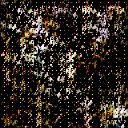

BATCH_SIZE 256
Gen loss: 2.6506588
Disc loss: 0.6438429
Disc accuracy: 0.953125


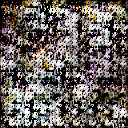

BATCH_SIZE 228
Gen loss: 1.9494015
Disc loss: 0.6086639
Disc accuracy: 0.872807


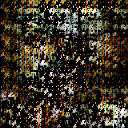


Epoch: 57
BATCH_SIZE 256
Gen loss: 2.177946
Disc loss: 0.55615985
Disc accuracy: 0.91015625


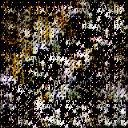

BATCH_SIZE 256
Gen loss: 2.6070685
Disc loss: 0.5728084
Disc accuracy: 0.96484375


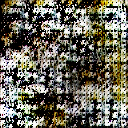

BATCH_SIZE 228
Gen loss: 2.3001058
Disc loss: 0.7166095
Disc accuracy: 0.9298246


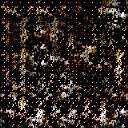


Epoch: 58
BATCH_SIZE 256
Gen loss: 1.6011201
Disc loss: 0.6478492
Disc accuracy: 0.8046875


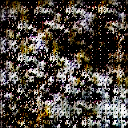

BATCH_SIZE 256
Gen loss: 2.2233403
Disc loss: 0.7373545
Disc accuracy: 0.8984375


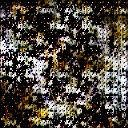

BATCH_SIZE 228
Gen loss: 2.4019477
Disc loss: 0.7000635
Disc accuracy: 0.94298244


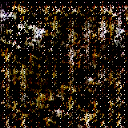


Epoch: 59
BATCH_SIZE 256
Gen loss: 1.6027296
Disc loss: 0.689616
Disc accuracy: 0.828125


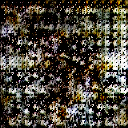

BATCH_SIZE 256
Gen loss: 1.6633409
Disc loss: 0.79577637
Disc accuracy: 0.82421875


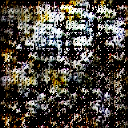

BATCH_SIZE 228
Gen loss: 2.0888708
Disc loss: 0.7560941
Disc accuracy: 0.9298246


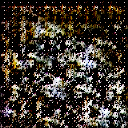


Epoch: 60
BATCH_SIZE 256
Gen loss: 2.0505407
Disc loss: 0.77655584
Disc accuracy: 0.90234375


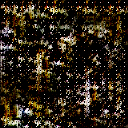

BATCH_SIZE 256
Gen loss: 1.3524537
Disc loss: 0.77145183
Disc accuracy: 0.7890625


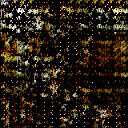

BATCH_SIZE 228
Gen loss: 1.5719072
Disc loss: 0.73299694
Disc accuracy: 0.85087717


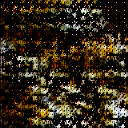


Epoch: 61
BATCH_SIZE 256
Gen loss: 2.0606143
Disc loss: 0.7688414
Disc accuracy: 0.92578125


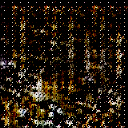

BATCH_SIZE 256
Gen loss: 1.794295
Disc loss: 0.67867213
Disc accuracy: 0.9140625


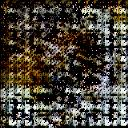

BATCH_SIZE 228
Gen loss: 1.6491114
Disc loss: 0.6515723
Disc accuracy: 0.9035088


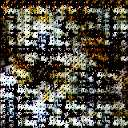


Epoch: 62
BATCH_SIZE 256
Gen loss: 1.9292351
Disc loss: 0.56674224
Disc accuracy: 0.9375


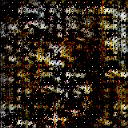

BATCH_SIZE 256
Gen loss: 2.2288988
Disc loss: 0.4843634
Disc accuracy: 0.96484375


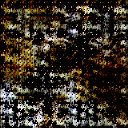

BATCH_SIZE 228
Gen loss: 2.4559872
Disc loss: 0.42044872
Disc accuracy: 0.9780702


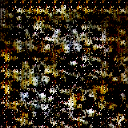


Epoch: 63
BATCH_SIZE 256
Gen loss: 2.2873695
Disc loss: 0.38980898
Disc accuracy: 0.953125


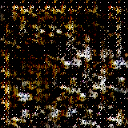

BATCH_SIZE 256
Gen loss: 2.40664
Disc loss: 0.3717131
Disc accuracy: 0.9765625


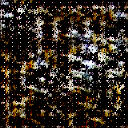

BATCH_SIZE 228
Gen loss: 2.774791
Disc loss: 0.2816226
Disc accuracy: 0.98245615


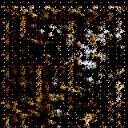


Epoch: 64
BATCH_SIZE 256
Gen loss: 3.0391605
Disc loss: 0.26528883
Disc accuracy: 1.0


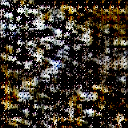

BATCH_SIZE 256
Gen loss: 2.9834766
Disc loss: 0.24811274
Disc accuracy: 0.97265625


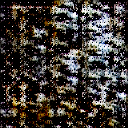

BATCH_SIZE 228
Gen loss: 2.9575582
Disc loss: 0.18990333
Disc accuracy: 0.99122804


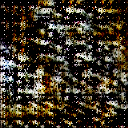


Epoch: 65
BATCH_SIZE 256
Gen loss: 3.177753
Disc loss: 0.18136129
Disc accuracy: 0.99609375


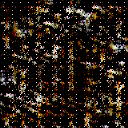

BATCH_SIZE 256
Gen loss: 3.6914816
Disc loss: 0.16698036
Disc accuracy: 0.98828125


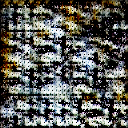

BATCH_SIZE 228
Gen loss: 4.0301766
Disc loss: 0.13020432
Disc accuracy: 1.0


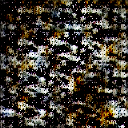


Epoch: 66
BATCH_SIZE 256
Gen loss: 4.180817
Disc loss: 0.12496671
Disc accuracy: 0.99609375


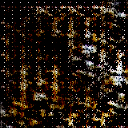

BATCH_SIZE 256
Gen loss: 4.0676165
Disc loss: 0.09520904
Disc accuracy: 0.99609375


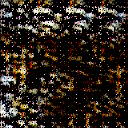

BATCH_SIZE 228
Gen loss: 4.06062
Disc loss: 0.12481351
Disc accuracy: 0.99122804


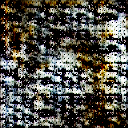


Epoch: 67
BATCH_SIZE 256
Gen loss: 4.345287
Disc loss: 0.1124225
Disc accuracy: 0.99609375


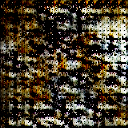

BATCH_SIZE 256
Gen loss: 4.357328
Disc loss: 0.09287788
Disc accuracy: 1.0


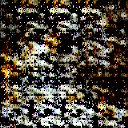

BATCH_SIZE 228
Gen loss: 4.476484
Disc loss: 0.097448125
Disc accuracy: 0.99122804


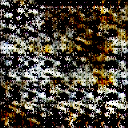


Epoch: 68
BATCH_SIZE 256
Gen loss: 4.6781836
Disc loss: 0.09847461
Disc accuracy: 1.0


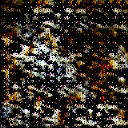

BATCH_SIZE 256
Gen loss: 4.6527343
Disc loss: 0.09997249
Disc accuracy: 0.9921875


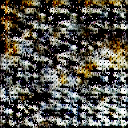

BATCH_SIZE 228
Gen loss: 4.5230637
Disc loss: 0.11821595
Disc accuracy: 1.0


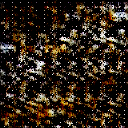


Epoch: 69
BATCH_SIZE 256
Gen loss: 4.3632326
Disc loss: 0.118299134
Disc accuracy: 1.0


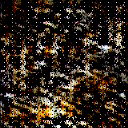

BATCH_SIZE 256
Gen loss: 4.276011
Disc loss: 0.11353031
Disc accuracy: 1.0


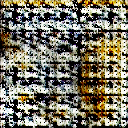

BATCH_SIZE 228
Gen loss: 4.0719905
Disc loss: 0.09328394
Disc accuracy: 1.0


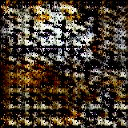


Epoch: 70
BATCH_SIZE 256
Gen loss: 3.9850209
Disc loss: 0.115063235
Disc accuracy: 0.9921875


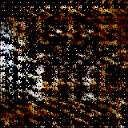

BATCH_SIZE 256
Gen loss: 4.391387
Disc loss: 0.14567459
Disc accuracy: 1.0


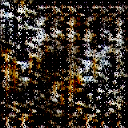

BATCH_SIZE 228
Gen loss: 4.019864
Disc loss: 0.11389367
Disc accuracy: 0.99122804


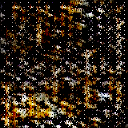


Epoch: 71
BATCH_SIZE 256
Gen loss: 4.1197176
Disc loss: 0.12925926
Disc accuracy: 1.0


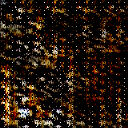

BATCH_SIZE 256
Gen loss: 4.14406
Disc loss: 0.14546168
Disc accuracy: 0.99609375


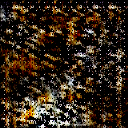

BATCH_SIZE 228
Gen loss: 3.8878832
Disc loss: 0.13591343
Disc accuracy: 0.99561405


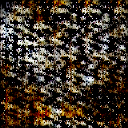


Epoch: 72
BATCH_SIZE 256
Gen loss: 3.4860775
Disc loss: 0.1661968
Disc accuracy: 0.9921875


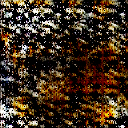

BATCH_SIZE 256
Gen loss: 3.6437378
Disc loss: 0.15371297
Disc accuracy: 0.98828125


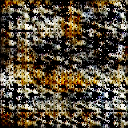

BATCH_SIZE 228
Gen loss: 3.830243
Disc loss: 0.19143802
Disc accuracy: 0.99122804


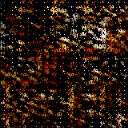


Epoch: 73
BATCH_SIZE 256
Gen loss: 3.9356623
Disc loss: 0.19511765
Disc accuracy: 1.0


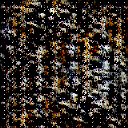

BATCH_SIZE 256
Gen loss: 3.457626
Disc loss: 0.18413238
Disc accuracy: 0.98828125


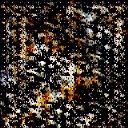

BATCH_SIZE 228
Gen loss: 3.2044952
Disc loss: 0.2188828
Disc accuracy: 0.9649123


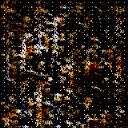


Epoch: 74
BATCH_SIZE 256
Gen loss: 3.6816998
Disc loss: 0.19215631
Disc accuracy: 0.9921875


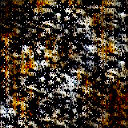

BATCH_SIZE 256
Gen loss: 4.315942
Disc loss: 0.22568594
Disc accuracy: 1.0


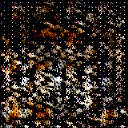

BATCH_SIZE 228
Gen loss: 3.625839
Disc loss: 0.22365415
Disc accuracy: 0.99561405


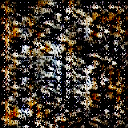


Epoch: 75
BATCH_SIZE 256
Gen loss: 2.455798
Disc loss: 0.29776114
Disc accuracy: 0.921875


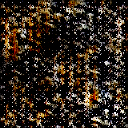

BATCH_SIZE 256
Gen loss: 2.933974
Disc loss: 0.22135639
Disc accuracy: 0.96875


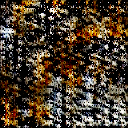

BATCH_SIZE 228
Gen loss: 3.921867
Disc loss: 0.24047095
Disc accuracy: 0.99561405


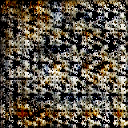


Epoch: 76
BATCH_SIZE 256
Gen loss: 4.1680713
Disc loss: 0.24795327
Disc accuracy: 1.0


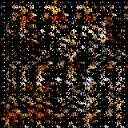

BATCH_SIZE 256
Gen loss: 3.328915
Disc loss: 0.23007727
Disc accuracy: 0.9921875


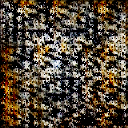

BATCH_SIZE 228
Gen loss: 2.5096629
Disc loss: 0.2804069
Disc accuracy: 0.94298244


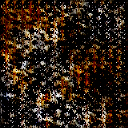


Epoch: 77
BATCH_SIZE 256
Gen loss: 2.725956
Disc loss: 0.26592636
Disc accuracy: 0.97265625


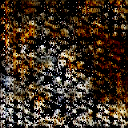

BATCH_SIZE 256
Gen loss: 3.44412
Disc loss: 0.27531043
Disc accuracy: 0.98828125


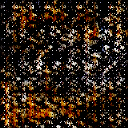

BATCH_SIZE 228
Gen loss: 3.5492916
Disc loss: 0.30673388
Disc accuracy: 0.99561405


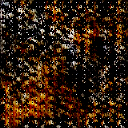


Epoch: 78
BATCH_SIZE 256
Gen loss: 3.013942
Disc loss: 0.3506715
Disc accuracy: 0.96484375


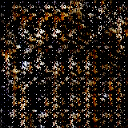

BATCH_SIZE 256
Gen loss: 2.2400055
Disc loss: 0.38073012
Disc accuracy: 0.86328125


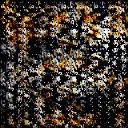

BATCH_SIZE 228
Gen loss: 3.097163
Disc loss: 0.29842016
Disc accuracy: 0.9780702


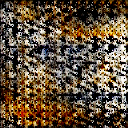


Epoch: 79
BATCH_SIZE 256
Gen loss: 3.4980597
Disc loss: 0.41374397
Disc accuracy: 0.9765625


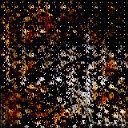

BATCH_SIZE 256
Gen loss: 2.6584325
Disc loss: 0.38160592
Disc accuracy: 0.9765625


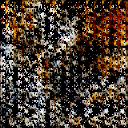

BATCH_SIZE 228
Gen loss: 1.9705329
Disc loss: 0.51990235
Disc accuracy: 0.877193


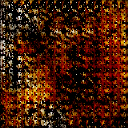


Epoch: 80
BATCH_SIZE 256
Gen loss: 2.4827838
Disc loss: 0.48017138
Disc accuracy: 0.94140625


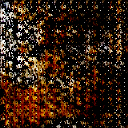

BATCH_SIZE 256
Gen loss: 3.0910294
Disc loss: 0.6068636
Disc accuracy: 0.97265625


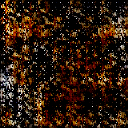

BATCH_SIZE 228
Gen loss: 2.1462424
Disc loss: 0.55865264
Disc accuracy: 0.8815789


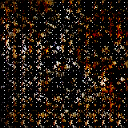


Epoch: 81
BATCH_SIZE 256
Gen loss: 2.156602
Disc loss: 0.630791
Disc accuracy: 0.87109375


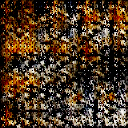

BATCH_SIZE 256
Gen loss: 2.2644727
Disc loss: 0.6294383
Disc accuracy: 0.921875


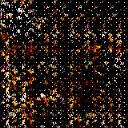

BATCH_SIZE 228
Gen loss: 2.5417337
Disc loss: 0.73525083
Disc accuracy: 0.94736844


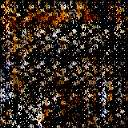


Epoch: 82
BATCH_SIZE 256
Gen loss: 1.4317973
Disc loss: 0.85655415
Disc accuracy: 0.7890625


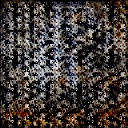

BATCH_SIZE 256
Gen loss: 2.3370469
Disc loss: 0.74666786
Disc accuracy: 0.9140625


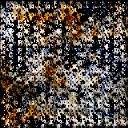

BATCH_SIZE 228
Gen loss: 2.373847
Disc loss: 0.879465
Disc accuracy: 0.88596493


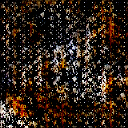


Epoch: 83
BATCH_SIZE 256
Gen loss: 1.1648308
Disc loss: 0.99777937
Disc accuracy: 0.65234375


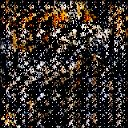

BATCH_SIZE 256
Gen loss: 2.9561353
Disc loss: 1.1358223
Disc accuracy: 0.94921875


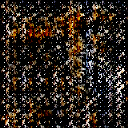

BATCH_SIZE 228
Gen loss: 1.2272528
Disc loss: 1.0175912
Disc accuracy: 0.6666667


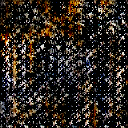


Epoch: 84
BATCH_SIZE 256
Gen loss: 1.7335718
Disc loss: 1.0671988
Disc accuracy: 0.84375


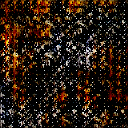

BATCH_SIZE 256
Gen loss: 2.007171
Disc loss: 0.97586775
Disc accuracy: 0.8515625


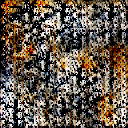

BATCH_SIZE 228
Gen loss: 1.3741357
Disc loss: 1.0098457
Disc accuracy: 0.7149123


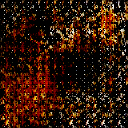


Epoch: 85
BATCH_SIZE 256
Gen loss: 2.0916257
Disc loss: 1.1711271
Disc accuracy: 0.86328125


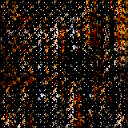

BATCH_SIZE 256
Gen loss: 1.2229095
Disc loss: 1.1537471
Disc accuracy: 0.62890625


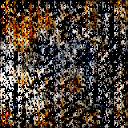

BATCH_SIZE 228
Gen loss: 2.579245
Disc loss: 1.3120147
Disc accuracy: 0.877193


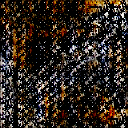


Epoch: 86
BATCH_SIZE 256
Gen loss: 1.1556128
Disc loss: 1.2507083
Disc accuracy: 0.60546875


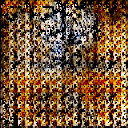

BATCH_SIZE 256
Gen loss: 2.2478528
Disc loss: 1.1341192
Disc accuracy: 0.83203125


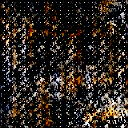

BATCH_SIZE 228
Gen loss: 2.0104804
Disc loss: 1.0131321
Disc accuracy: 0.80263156


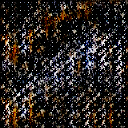


Epoch: 87
BATCH_SIZE 256
Gen loss: 1.3794881
Disc loss: 1.169105
Disc accuracy: 0.66796875


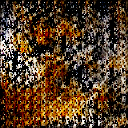

BATCH_SIZE 256
Gen loss: 2.7266133
Disc loss: 1.0889633
Disc accuracy: 0.87890625


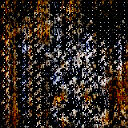

BATCH_SIZE 228
Gen loss: 1.4859709
Disc loss: 1.0319496
Disc accuracy: 0.65789473


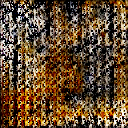


Epoch: 88
BATCH_SIZE 256
Gen loss: 2.753475
Disc loss: 0.783134
Disc accuracy: 0.921875


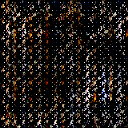

BATCH_SIZE 256
Gen loss: 2.2703657
Disc loss: 0.77360064
Disc accuracy: 0.8515625


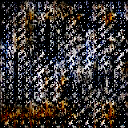

BATCH_SIZE 228
Gen loss: 1.5043184
Disc loss: 0.9981681
Disc accuracy: 0.6798246


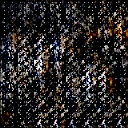


Epoch: 89
BATCH_SIZE 256
Gen loss: 3.5298843
Disc loss: 0.8124528
Disc accuracy: 0.953125


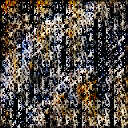

BATCH_SIZE 256
Gen loss: 2.4090598
Disc loss: 0.7006475
Disc accuracy: 0.85546875


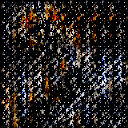

BATCH_SIZE 228
Gen loss: 1.3907796
Disc loss: 0.8073416
Disc accuracy: 0.69736844


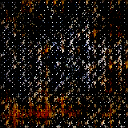


Epoch: 90
BATCH_SIZE 256
Gen loss: 4.097783
Disc loss: 0.7281906
Disc accuracy: 0.99609375


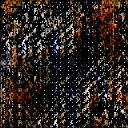

BATCH_SIZE 256
Gen loss: 3.0227647
Disc loss: 0.5186681
Disc accuracy: 0.984375


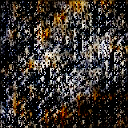

BATCH_SIZE 228
Gen loss: 0.6040235
Disc loss: 1.28721
Disc accuracy: 0.3508772


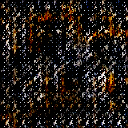


Epoch: 91
BATCH_SIZE 256
Gen loss: 6.361926
Disc loss: 1.8037724
Disc accuracy: 0.99609375


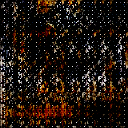

BATCH_SIZE 256
Gen loss: 3.670921
Disc loss: 0.6511809
Disc accuracy: 0.984375


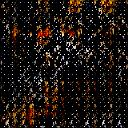

BATCH_SIZE 228
Gen loss: 0.3573937
Disc loss: 2.162074
Disc accuracy: 0.13157895


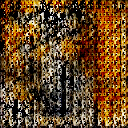


Epoch: 92
BATCH_SIZE 256
Gen loss: 5.0520782
Disc loss: 0.9016006
Disc accuracy: 1.0


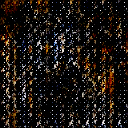

BATCH_SIZE 256
Gen loss: 6.2472568
Disc loss: 1.0590912
Disc accuracy: 1.0


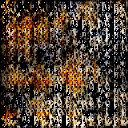

BATCH_SIZE 228
Gen loss: 1.7887616
Disc loss: 0.4463702
Disc accuracy: 0.872807


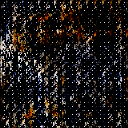


Epoch: 93
BATCH_SIZE 256
Gen loss: 0.8868737
Disc loss: 0.94219774
Disc accuracy: 0.453125


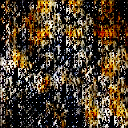

BATCH_SIZE 256
Gen loss: 5.4460793
Disc loss: 0.6743302
Disc accuracy: 0.98828125


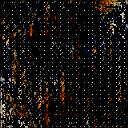

BATCH_SIZE 228
Gen loss: 6.5832176
Disc loss: 1.1628188
Disc accuracy: 0.99561405


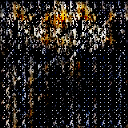


Epoch: 94
BATCH_SIZE 256
Gen loss: 2.452209
Disc loss: 0.36052895
Disc accuracy: 0.921875


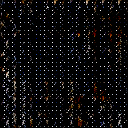

BATCH_SIZE 256
Gen loss: 1.0974782
Disc loss: 1.326884
Disc accuracy: 0.50390625


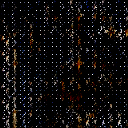

BATCH_SIZE 228
Gen loss: 4.2382927
Disc loss: 0.2487202
Disc accuracy: 1.0


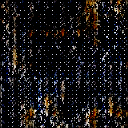


Epoch: 95
BATCH_SIZE 256
Gen loss: 7.1591587
Disc loss: 0.9401744
Disc accuracy: 0.99609375


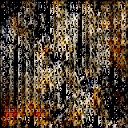

BATCH_SIZE 256
Gen loss: 5.0332327
Disc loss: 0.3120592
Disc accuracy: 0.9921875


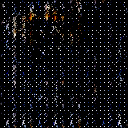

BATCH_SIZE 228
Gen loss: 1.7061776
Disc loss: 0.6312027
Disc accuracy: 0.74122804


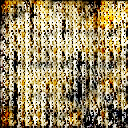


Epoch: 96
BATCH_SIZE 256
Gen loss: 1.7395749
Disc loss: 0.56002665
Disc accuracy: 0.72265625


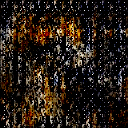

BATCH_SIZE 256
Gen loss: 4.7242126
Disc loss: 0.39089283
Disc accuracy: 1.0


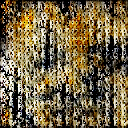

BATCH_SIZE 228
Gen loss: 6.7122307
Disc loss: 0.7899891
Disc accuracy: 1.0


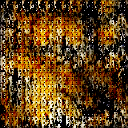


Epoch: 97
BATCH_SIZE 256
Gen loss: 5.120045
Disc loss: 0.26910764
Disc accuracy: 1.0


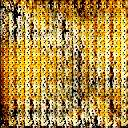

BATCH_SIZE 256
Gen loss: 2.3554182
Disc loss: 0.5490397
Disc accuracy: 0.80078125


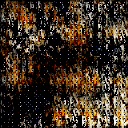

BATCH_SIZE 228
Gen loss: 2.1254768
Disc loss: 0.6571706
Disc accuracy: 0.63596493


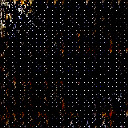


Epoch: 98
BATCH_SIZE 256
Gen loss: 5.0502844
Disc loss: 0.45557818
Disc accuracy: 1.0


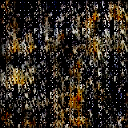

BATCH_SIZE 256
Gen loss: 5.8691664
Disc loss: 0.76083654
Disc accuracy: 1.0


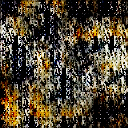

BATCH_SIZE 228
Gen loss: 3.6494899
Disc loss: 0.40877038
Disc accuracy: 0.96929824


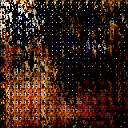


Epoch: 99
BATCH_SIZE 256
Gen loss: 1.7584397
Disc loss: 0.921234
Disc accuracy: 0.57421875


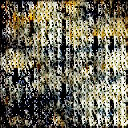

BATCH_SIZE 256
Gen loss: 2.9027894
Disc loss: 0.7039105
Disc accuracy: 0.828125


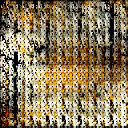

BATCH_SIZE 228
Gen loss: 5.0793824
Disc loss: 1.0695099
Disc accuracy: 0.98245615


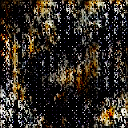

In [ ]:
#print(np.zeros_like(resized).ndim)
#print(train_dataset.batch(batch_size))
train(train_dataset, np.zeros((740, 10)), 100)

In [ ]:
generator.save('./drive/MyDrive/generator')
discriminator.save('./drive/MyDrive/discriminator')

INFO:tensorflow:Assets written to: ./drive/MyDrive/generator/assets
INFO:tensorflow:Assets written to: ./drive/MyDrive/discriminator/assets


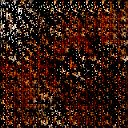

In [ ]:
# creation of random noise plus some number of conditional variables
noise = tf.convert_to_tensor(np.concatenate([np.random.normal(0, 1, 100), np.array([1,1,1,1,1,1,1,1,1,1])], axis=None).astype(np.float32))
noise = tf.reshape(noise, [1, 110])
# print(noise, noise.shape)

# running the generator with no training
generated_image = generator(noise, training=False)
#print(generated_image)
# the result of one run of the generator, with no training
cv2_imshow(generated_image[0, :, :, :].numpy() * 255.0)
# print(generated_image[0, :, :, :])